###IMPORTS:

In [0]:
import pandas as pd
import numpy as np
import datetime
from time import gmtime
from time import strftime
import pandas_profiling as pp
import matplotlib.pyplot as plt
import unicodedata
import plotly.graph_objects as go
from IPython.display import HTML
from IPython.display import clear_output
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from datetime import time
from shapely.geometry import Point, Polygon
!pip install geopandas;
import geopandas as gpd
%matplotlib inline
clear_output()
# !pip install geopandas

In [0]:
from google.colab import drive
drive.mount('/content/drive')
%cd drive/My Drive/UIS/IA/Dataset/Mapa
!pwd
clear_output()

### Predicción de la fecha y hora de un delito sexual




![banner](https://drive.google.com/uc?id=1hYy6WuEgEs5P3FElF957qUeqVFr_TQzh)

**Integrantes:**

- Eduard Alfonso Caballero Ponguta - 2151099
- Sergio Andrés Dulcey Lizarazo - 2151830
- Juan Pablo Viviescas Romero - 2152499


### **Objetivo general**

- Realizar una predicción del dia de la semana y la hora en que ocurre un posible caso de delito sexual, por medio de un análisis de datos proporcionados por la policía nacional colombiana.

### **Objetivos especificos**

-  Implementar diferentes modelos de predicción, tanto clasificadores como regresores para las caracteristicas [Municipio (type: string), Dia (type: string), Hora (type: timestamp)]
-  Determinar los modelos que permiten una mejor prediccion del *municipio*, *día de la semana*  y la *hora* a partir de las demás caracteristicas.

### Preguntas por responder



- **Problema a resolver:**  
R: ¿Es posible predecir el municipio, la hora y fecha de un delito sexual?
- **¿Como se va resolver?**  
R: Por medio de varios regresores y clasificadores, se va a tratar los datos para hallar una pauta y determinar si existen patrones que nos permitan determinar si se puede pronosticar un delito 
- **¿Por qué se necesita resolver este problema?**  
R: Para mejorar la seguridad publica y la calidad de vida de los ciudadanos
- **¿Para que?**  
R: Para reforzar la seguridad de un sector de la ciudad en cierta hora, además de prevenir que los ciudadanos transiten por esa zona reduciendo el número de casos de acoso.
- **¿Para quien(es) seria util esta solucion?**  
R: Para la policía, con el fin de que hagan más seguridad por esas zonas

### Contenido del DATASET


| Variables | Descripción |
|-----------------------|---------------------------------------------------------------------------------|
| **Departamento** | Departamento donde sucedio el delito. (formato: string) |
| **Municipio** | Municipio donde sucedio el delito. (formato: string) |
| **Día** | Nombre del día en el que sucedio el delito. (formato: string) |
| **Hora** | Hora en el que sucedio el delito. (formato: timestamp) |
| **Barrio** | Barrio donde ocurrio la agresión. (formato: int) |
| **Zona** | Distrito en que ocurrio la agresión. (formato: int) |
| **Clase_de_sitio** | Categoria del sitio donde ocurre la agresión. (formato: int) |
| **Arma_empleada** | Objeto empleado por el agresor para intimidar a la victima. (formato: int) |
| **Móvil_Agresor** |Tipo de desplazamiento que empleo el agresor para llegar hacia donde se encontraba la victima (formato: int) |
| **Móvil_Victima** | Tipo de desplazamiento empleado por la victima en el momento que ocurrío la agresión. (formato: int) |
| **Edad** |Edad de la victima. (formato: int) |
| **Sexo** | Sexo de la victima. (formato: int) | |
| **Estado_civil** |  Vinculos personales de la victima. (formato: int)| 
| **Clase_de_empleado** | Tipo de profesión que desempeña la victima. (formato: int) |
|  **Mes** | Mes en el que sucedio el delito. (formato: int) | |
|  **Dia_mes** | Dia del mes en el que sucedio el delito. (formato: int) | | 


### DOCUMENTACION DEL PROBLEMA

En la actualidad se evidencia el incremento de delitos sexuales en la mayoría de
países del mundo, cada uno con sus distintas leyes para tratar estos problemas.
Utilizando un conjunto de datos sobre delitos sexuales en Colombia que fueron
suministrados por la Dijin - Policía Nacional de Colombia vinculados con la
información de la fiscalía general de la nación que datan del 01 de enero al 31 de
diciembre de 2019, donde se observa características particulares sobre estos casos.
Analizaremos esta problemática que se presenta en Colombia para determinar
distintos factores sobre los delitos sexuales.





#IMPLEMENTACIÓN:


# Preprocesamiento de los datos

Importar el Dataset:

In [0]:
data = pd.read_excel('https://www.datos.gov.co/api/views/tdf6-87g7/files/009bb922-10ab-4ccd-b828-34a7b0946ae1?download=true&filename=delitos-sexuales-2019.xls')

Ajustes al Dataset

In [0]:
ind=data.iloc[7].values
data.columns = ind
data = data[8:33799]
# data.dropna(thresh=19,inplace=True)

Dataset sin tratar:

In [0]:
data.head()

,Fecha,Departamento,Municipio,DELITO,Día,Hora,Barrio,Zona,Clase de sitio,Arma empleada,Móvil Agresor,Móvil Victima,Edad,Sexo,Estado civil,País de nacimiento,Clase de empleado,Profesión,Escolaridad,Código DANE,Cantidad
8,2019-01-01 00:00:00,AMAZONAS,LETICIA (CT),ARTÍCULO 209. ACTOS SEXUALES CON MENOR DE 14 AÑOS,Martes,18:00:00,NO REPORTADO,RURAL,CASAS DE APUESTAS,SIN EMPLEO DE ARMAS,A PIE,A PIE,7,FEMENINO,-,COLOMBIA,NO REPORTA,-,-,91001000,1
9,2019-01-01 00:00:00,AMAZONAS,LETICIA (CT),ARTÍCULO 209. ACTOS SEXUALES CON MENOR DE 14 AÑOS,Martes,18:00:00,NO REPORTADO,RURAL,CASAS DE APUESTAS,SIN EMPLEO DE ARMAS,A PIE,A PIE,21,FEMENINO,UNION LIBRE,COLOMBIA,INDEPENDIENTE,-,PRIMARIA,91001000,1
10,2019-01-01 00:00:00,ANTIOQUIA,ABRIAQUÍ,ARTÍCULO 209. ACTOS SEXUALES CON MENOR DE 14 AÑOS,Martes,00:00:00,SAN JOSE,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,16,FEMENINO,SOLTERO,COLOMBIA,ESTUDIANTE,-,SECUNDARIA,05004000,1
11,2019-01-01 00:00:00,ANTIOQUIA,AMAGÁ,ARTÍCULO 208. ACCESO CARNAL ABUSIVO CON MENOR ...,Martes,10:00:00,LA GUALI,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,4,FEMENINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADA,SECUNDARIA,05030000,1
12,2019-01-01 00:00:00,ANTIOQUIA,AMAGÁ,ARTÍCULO 208. ACCESO CARNAL ABUSIVO CON MENOR ...,Martes,10:00:00,LA GUALI,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,8,FEMENINO,SOLTERO,COLOMBIA,EMPLEADO PARTICULAR,NO REPORTADA,PRIMARIA,05030000,1


Por medio de una serie de tiempo se puede conocer en que año fue donde ocurrio más casos de delito sexuales en Colombia, dado que el dataset es del año 2019: Mayo-1-2019

In [0]:
# datos
valor=data['Fecha'].groupby(data.Fecha.dt.to_period("M")).agg('count')
valor=np.array(valor)
indices=data['Fecha'].groupby(data.Fecha.dt.to_period("M")).agg('count').index.tolist()
años=[str(i) for i in indices]

# Crear figura
fig = go.Figure()

fig.add_trace(go.Scatter(x=list(años), y=list(valor)))

# Establecer el título
fig.update_layout(title_text="Fecha ")

# Añadir rango del slider
fig.update_layout(xaxis=go.layout.XAxis(rangeselector=dict(buttons=list([
        dict(count=1,label="Mensual",step="month",stepmode="backward"),
        dict(count=1,label="Anual",step="year",stepmode="backward"),
        dict(step="all")])),rangeslider=dict(visible=True),type="date"))

fig.show()

Por alta Correlación con la columna Departamento, se elimina Código Dane, y no se consideran las siguientes columnas por su poca información

In [0]:
#Por alta correlacion con Deparatamento se elimina Código DANE
del data['Código DANE']
#No se consideran las siguientes columnas
del data['País de nacimiento']
del data['Profesión']
del data['Cantidad']
del data['DELITO']
del data['Escolaridad']

Se trata la fecha de los hechos que se encuentra en el Dataset , y se divide en Mes y Dia_mes

In [0]:
#Se trata la fecha de los hechos
data["Mes"] = data.Fecha.dt.strftime('%m') 
data["Dia_mes"] = data.Fecha.dt.strftime('%d') 
del data['Fecha']
# data["Mes"] = pd.DatetimeIndex(data["Fecha"]).month
# data["Dia_mes"] = pd.DatetimeIndex(data["Fecha"]).day
# del data["Fecha"]

Se limpia los datos inconsistentes encontrados en el dataset,se ajustan datos como son "-" y "NO REPORTADO", a "NO REPORTA"

In [0]:
#Limpiando datos None/-/
data.Hora.replace(to_replace=[None], value=time(0, 0), inplace=True)
data.replace(to_replace=[None], value="NO REPORTA", inplace=True)
data.replace('-', "NO REPORTA",inplace=True) 
data.replace('NO REPORTADO', "NO REPORTA",inplace=True) 
data.replace('NaT', "00",inplace=True)
muni = []
for mun in data.index:
  m = str(data.at[mun,"Municipio"])
  m = m.replace(" (CT)", "")
  muni.append(m)

data["Municipio"] = muni
#Reindex
data.reset_index(inplace=True,drop=True)


Elimina acentos de los nombres:

In [0]:
#Elimina acentos de los nombres (´,ñ)
def acentos(cadena):
  s = ''.join((c for c in unicodedata.normalize('NFD',cadena) if unicodedata.category(c) != 'Mn'))
  return s

In [0]:
data["Mun_Dep"] = data["Municipio"]+"-"+data["Departamento"]
val = []
for i in data.index:
  val.append(acentos(data.Mun_Dep[i]))
data['Mun_Dep'] = val
del data["Municipio"]
del data["Departamento"]

Se modifica la hora, para que quede en el total de segundos

In [0]:
n_hora = []
for hour in data.index:
  t = str(data.at[hour,"Hora"])
  h,m,s = t.split(':')
  hora = int(datetime.timedelta(hours=int(h),minutes=int(m),seconds=int(s)).total_seconds())
  n_hora.append(hora)
data["Hora"] = n_hora

Se cambia el nombre de las columnas que tienen espacio

In [0]:
data.rename(columns={'Clase de sitio':'Clase_de_sitio',
                        'Arma empleada':'Arma_empleada',
                     'Móvil Agresor':'Móvil_Agresor',
                     'Móvil Victima':'Móvil_Victima',
                     'Estado civil':'Estado_civil',
                     'Clase de empleado':'Clase_de_empleado'},
                     #'DELITO':'Delito'},
               inplace=True)

Dataset que se originó, despues del procesamiento de datos:

In [0]:
data.head()

,Día,Hora,Barrio,Zona,Clase_de_sitio,Arma_empleada,Móvil_Agresor,Móvil_Victima,Edad,Sexo,Estado_civil,Clase_de_empleado,Mes,Dia_mes,Mun_Dep
0,Martes,64800,NO REPORTA,RURAL,CASAS DE APUESTAS,SIN EMPLEO DE ARMAS,A PIE,A PIE,7,FEMENINO,NO REPORTA,NO REPORTA,01,01,LETICIA-AMAZONAS
1,Martes,64800,NO REPORTA,RURAL,CASAS DE APUESTAS,SIN EMPLEO DE ARMAS,A PIE,A PIE,21,FEMENINO,UNION LIBRE,INDEPENDIENTE,01,01,LETICIA-AMAZONAS
2,Martes,0,SAN JOSE,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,16,FEMENINO,SOLTERO,ESTUDIANTE,01,01,ABRIAQUI-ANTIOQUIA
3,Martes,36000,LA GUALI,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,4,FEMENINO,SOLTERO,EMPLEADO PARTICULAR,01,01,AMAGA-ANTIOQUIA
4,Martes,36000,LA GUALI,RURAL,FINCAS Y SIMILARES,SIN EMPLEO DE ARMAS,A PIE,A PIE,8,FEMENINO,SOLTERO,EMPLEADO PARTICULAR,01,01,AMAGA-ANTIOQUIA


# Análisis de datos

In [0]:
#datos
idx = data['Mun_Dep'].value_counts().index.tolist()
valores=data['Mun_Dep'].value_counts() 
print(idx)

# Usar `hole` para crear una dona en el diagrama
fig = go.Figure(data=[go.Pie(labels=idx, values=valores, hole=.3)])
# Establecer el título
fig.update_layout(title_text="Incidencia por Municipio_Departamento")
fig.show()





['BOGOTA D.C.-CUNDINAMARCA', 'MEDELLIN-ANTIOQUIA', 'CALI-VALLE', 'BARRANQUILLA-ATLANTICO', 'CARTAGENA-BOLIVAR', 'IBAGUE-TOLIMA', 'PEREIRA-RISARALDA', 'VILLAVICENCIO-META', 'PASTO-NARINO', 'BUCARAMANGA-SANTANDER', 'NEIVA-HUILA', 'SOLEDAD-ATLANTICO', 'MANIZALES-CALDAS', 'CUCUTA-NORTE DE SANTANDER', 'SANTA MARTA-MAGDALENA', 'SOACHA-CUNDINAMARCA', 'VALLEDUPAR-CESAR', 'POPAYAN-CAUCA', 'BELLO-ANTIOQUIA', 'MONTERIA-CORDOBA', 'PALMIRA-VALLE', 'BARRANCABERMEJA-SANTANDER', 'SINCELEJO-SUCRE', 'ITAGUI-ANTIOQUIA', 'PITALITO-HUILA', 'FLORENCIA-CAQUETA', 'ARMENIA-QUINDIO', 'DOSQUEBRADAS-RISARALDA', 'TUNJA-BOYACA', 'FLORIDABLANCA-SANTANDER', 'FUSAGASUGA-CUNDINAMARCA', 'TULUA-VALLE', 'ARAUCA-ARAUCA', 'FACATATIVA-CUNDINAMARCA', 'PIEDECUESTA-SANTANDER', 'LETICIA-AMAZONAS', 'LA DORADA-CALDAS', 'GIRON-SANTANDER', 'RIOHACHA-GUAJIRA', 'BUENAVENTURA-VALLE', 'SAN JOSE DEL GUAVIARE-GUAVIARE', 'MALAMBO-ATLANTICO', 'QUIBDO-CHOCO', 'GUADALAJARA DE BUGA-VALLE', 'CARTAGO-VALLE', 'YOPAL-CASANARE', 'YUMBO-VALLE', 'SAN

In [0]:
#datos
idx = data['Sexo'].value_counts().index.tolist()
valores=data['Sexo'].value_counts() 
print(idx)

# Usar `hole` para crear una dona en el diagrama
fig = go.Figure(data=[go.Pie(labels=idx, values=valores, hole=.3)])
# Establecer el título
fig.update_layout(title_text="Incidencia por Sexo")
fig.show()

['FEMENINO', 'MASCULINO', 'NO REPORTA']


In [0]:
#datos
idx = data['Edad'].value_counts().index.tolist()
valores=data['Edad'].value_counts() 
print(idx)
#plotear la figura
fig = go.Figure(data=[go.Pie(labels=idx, values=valores)])
# Establecer el título
fig.update_layout(title_text="Incidencia por  Edad")
fig.show()

['13', '18', '12', '14', '11', '15', '10', '9', '8', '16', '7', '6', '5', '4', '17', '3', '40', '2', '19', '20', '23', '21', '22', '24', '29', '39', '25', '26', '28', '30', '27', '33', '34', '32', '31', '36', '37', '35', '1', '38', 'NO REPORTA', '41', '42', '43', '45', '44', '46', '48', '47', '49', '0', '51', '50', '54', '53', '52', '57', '55', '56', '62', '60', '58', '63', '59', '69', '61', '67', '71', '65', '70', '64', '75', '72', '78', '66', '81', '84', '68', '89', '91', '80', '73', '85', '86', '82', '88', '92', '74', '76', '93', '77', '79', '90', '83', '87']


# Codificación de los datos

Codificación de las clases con un valor entre 0 y n_clases-1:

In [0]:
#Codifica las clases con un valor entre 0 y n_clases-1
le1 = LabelEncoder()
data['Mun_Dep'] = le1.fit_transform(data["Mun_Dep"])
# le1 = LabelEncoder()
# data["Departamento"] = le1.fit_transform(data["Departamento"])
# le2 = LabelEncoder()
# data["Municipio"] = le2.fit_transform(data["Municipio"])
#le3 = LabelEncoder()
#data["Delito"] = le3.fit_transform(data["Delito"])
le4 = LabelEncoder()
data["Día"] = le4.fit_transform(data["Día"])
le5 = LabelEncoder()
data["Barrio"] = le5.fit_transform(data["Barrio"])
le6 = LabelEncoder()
data["Zona"] = le6.fit_transform(data["Zona"])
le7 = LabelEncoder()
data["Clase_de_sitio"] = le7.fit_transform(data["Clase_de_sitio"])
le8 = LabelEncoder()
data["Arma_empleada"] = le8.fit_transform(data["Arma_empleada"])
le9 = LabelEncoder()
data["Móvil_Agresor"] = le9.fit_transform(data["Móvil_Agresor"])
le10 = LabelEncoder()
data["Móvil_Victima"] = le10.fit_transform(data["Móvil_Victima"])
le11 = LabelEncoder()
data["Sexo"] = le11.fit_transform(data["Sexo"])
le12 = LabelEncoder()
data["Estado_civil"] = le12.fit_transform(data["Estado_civil"])
# le13 = LabelEncoder()
# data["Hora"] = le13.fit_transform(data["Hora"])
le14 = LabelEncoder()
data["Clase_de_empleado"] = le14.fit_transform(data["Clase_de_empleado"])
#le15 = LabelEncoder()
#data["Escolaridad"] = le15.fit_transform(data["Escolaridad"])
le16 = LabelEncoder()
data["Edad"] = le16.fit_transform(data["Edad"])
le17 = LabelEncoder()
data["Mes"] = le17.fit_transform(data["Mes"])
le18 = LabelEncoder()
data["Dia_mes"] = le18.fit_transform(data["Dia_mes"])
data.head()

,Día,Hora,Barrio,Zona,Clase_de_sitio,Arma_empleada,Móvil_Agresor,Móvil_Victima,Edad,Sexo,Estado_civil,Clase_de_empleado,Mes,Dia_mes,Mun_Dep
0,3,64800,3514,2,25,7,0,0,67,0,2,19,1,1,472
1,3,64800,3514,2,25,7,0,0,14,0,5,17,1,1,472
2,3,0,4172,2,59,7,0,0,8,0,4,15,1,1,2
3,3,36000,2719,2,59,7,0,0,34,0,4,11,1,1,31
4,3,36000,2719,2,59,7,0,0,78,0,4,11,1,1,31


Reporte Inicial que arroja el Dataset, sirve para mirar la correlación que se produce entre columnas:

In [0]:
#Reporte final
report = pp.ProfileReport(data)
report.to_file(output_file="Datos_iniciales.html")
HTML(filename='Datos_iniciales.html')

Number of variables,15
Number of observations,33791
Missing cells,0
Missing cells (%),0.0%
Duplicate rows,449
Duplicate rows (%),1.3%
Total size in memory,3.9 MiB
Average record size in memory,120.0 B
NUM,13
CAT,2
Analysis started,2020-03-31 21:58:42.643843


#Representación Grafica de los datos:

Una matriz de dispersión , Se utiliza para determinar si las variables están correlacionadas y si la correlación es positiva o negativa.

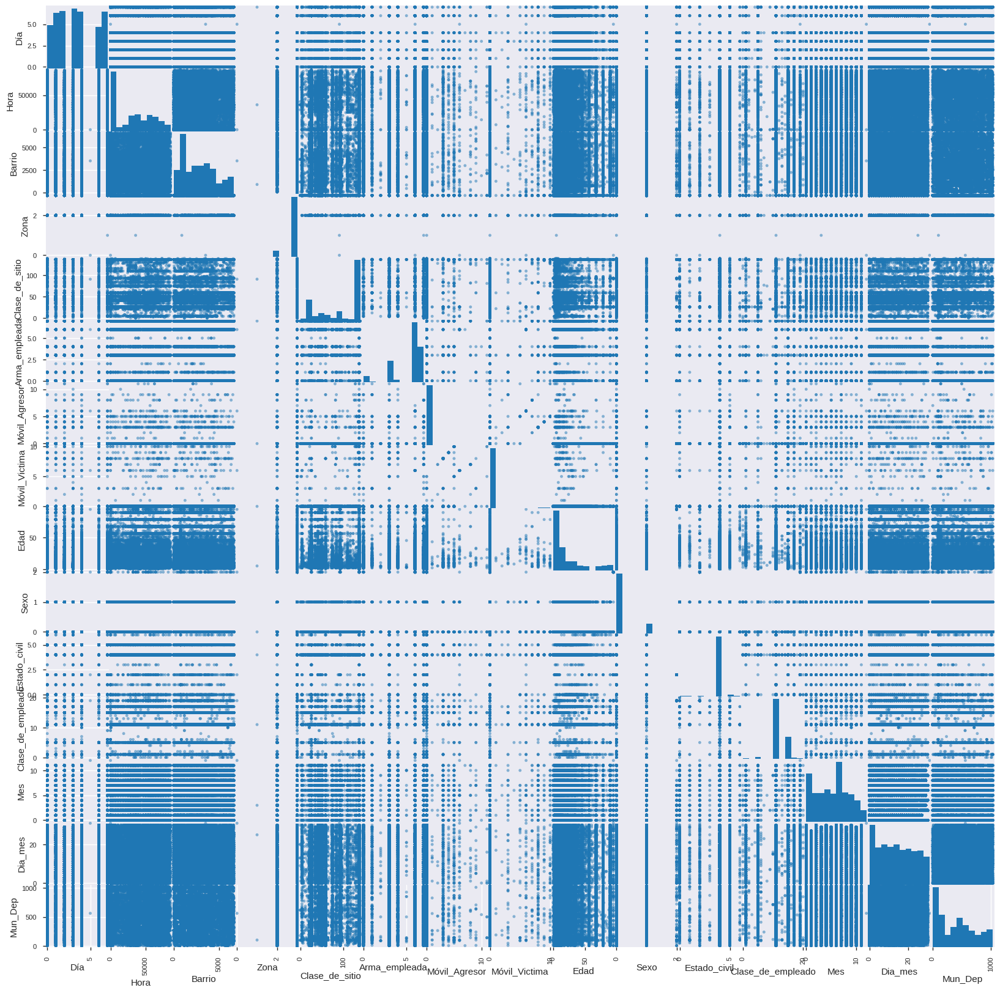

In [0]:
pd.plotting.scatter_matrix(data, figsize=(20,20));

# Algoritmo Machine learning:

In [0]:
#Classifiers
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.multioutput import MultiOutputClassifier
#Regressors
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import BaggingRegressor
#Metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import *
#Otros
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split
#PCA
from sklearn.decomposition import PCA
from sklearn import decomposition

In [0]:
da = data.values
X = da[:,[2,3,4,5,6,7,8,9,10,11,12,13]]
#CON PCA:
#X = PCA(n_components=1).fit_transform(X)
#OTRA MANERA:
#pca= decomposition.PCA(n_components=1)
#X= pca.fit_transform(X)
y_c = da[:,[0,14]]
y_r = da[:,1]
X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(X,y_c, test_size=.20)
X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(X,y_r, test_size=.20)


# Entrenamiento

## Clasificadores

In [0]:
DT_C = DecisionTreeClassifier().fit(X_train_c,y_train_c);
KN_C = KNeighborsClassifier().fit(X_train_c,y_train_c);
RF_C = RandomForestClassifier(n_estimators=2).fit(X_train_c,y_train_c);
XGB_C = MultiOutputClassifier(XGBClassifier()).fit(X_train_c,y_train_c);

In [0]:
DT_C_predicts = DT_C.predict(X_test_c)
KN_C_predicts = KN_C.predict(X_test_c)
RF_C_predicts = RF_C.predict(X_test_c)
XGB_C_predicts = XGB_C.predict(X_test_c)
#Accuracy
print ("DT Accuracy %.3f"% np.mean(DT_C_predicts == y_test_c))
print ("KN Accuracy %.3f"% np.mean(KN_C_predicts == y_test_c))
print ("RF Accuracy %.3f"% np.mean(RF_C_predicts == y_test_c))
print ("XGB Accuracy %.3f"% np.mean(XGB_C_predicts == y_test_c))
#error RMSE
print("-----------------")
print ("DT RMSE %.3f"% np.sqrt(mean_squared_error(y_test_c, DT_C_predicts)))
print ("KN RMSE %.3f"% np.sqrt(mean_squared_error(y_test_c, KN_C_predicts)))
print ("RF RMSE %.3f"% np.sqrt(mean_squared_error(y_test_c, RF_C_predicts)))
print ("XGB RMSE %.3f"% np.sqrt(mean_squared_error(y_test_c, XGB_C_predicts)))

DT Accuracy 0.451
KN Accuracy 0.302
RF Accuracy 0.271
XGB Accuracy 0.508
-----------------
DT RMSE 203.134
KN RMSE 228.702
RF RMSE 246.439
XGB RMSE 192.844


In [0]:
data_p = XGB_C_predicts
#data_p = GN_C.predict(X_test_c)
pr_do = [] #0
pr_lu = [] #2
pr_ma = [] #3
pr_mi = [] #4
pr_ju = [] #1
pr_vi = [] #7
pr_sa = [] #6
for i in range(len(data_p)):
  if data_p[i][0] == 0:
    pr_do.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 1:
    pr_ju.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 2:
    pr_lu.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 3:
    pr_ma.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 4:
    pr_mi.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 6:
    pr_sa.append(list(le1.inverse_transform([data_p[i][1]])))
  if data_p[i][0] == 7:
    pr_vi.append(list(le1.inverse_transform([data_p[i][1]])))
pr = [pr_do,pr_lu,pr_ma,pr_mi,pr_ju,pr_vi,pr_sa]

## Regresores

In [0]:
DT_R = DecisionTreeRegressor(max_depth=5).fit(X_train_r,y_train_r);
RF_R = RandomForestRegressor(n_estimators=40).fit(X_train_r,y_train_r);
# GB_R = MultiOutputRegressor(GradientBoostingRegressor()).fit(X_train_r,y_train_r);
# BG_R = MultiOutputRegressor(BaggingRegressor(base_estimator=GradientBoostingRegressor())).fit(X_train_r,y_train_r);
#GB_R = GradientBoostingRegressor()
#np.array([6,5,12,147]).reshape(1,-1)

In [0]:
DT_R_predicts = DT_R.predict(X_test_r)
RF_R_predicts = RF_R.predict(X_test_r)
# GB_R_predicts = GB_R.predict(X_test_r)
# BG_R_predicts = BG_R.predict(X_test_r)

#Accuracy
print ("DT Accuracy %.3f"% np.mean(DT_R_predicts == y_test_r))
print ("RF Accuracy %.3f"% np.mean(RF_R_predicts == y_test_r))
#Error RMSE
print ("DT RMSE %.3f"% np.sqrt(mean_squared_error(y_test_r, DT_R_predicts)))
print ("RF RMSE %.3f"% np.sqrt(mean_squared_error(y_test_r, RF_R_predicts)))

DT Accuracy 0.000
RF Accuracy 0.019
DT RMSE 26856.695
RF RMSE 27127.580


In [0]:
hora = []
for i in DT_R_predicts:
  h = gmtime(i)
  hora.append(h.tm_hour)

(array([4.400e+02, 7.800e+01, 2.635e+03, 1.289e+03, 3.189e+03, 7.590e+02,
        1.900e+01, 3.500e+01, 2.000e+00, 2.000e+00]),
 array([ 2. ,  3.7,  5.4,  7.1,  8.8, 10.5, 12.2, 13.9, 15.6, 17.3, 19. ]),
 <a list of 10 Patch objects>)

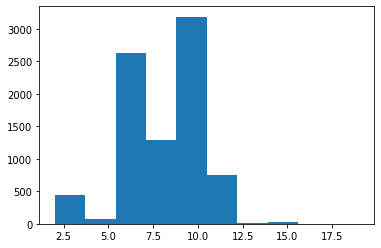

In [0]:
plt.hist(hora)

# GRAFICAR PREDICCIONES

In [0]:
d = pd.read_csv("municipioscolombia.csv",header=None)
d['Mun_Dep'] = d[1].str.upper()+"-"+d[3].str.upper()
val = []
for i in d.index:
  val.append(acentos(d.Mun_Dep[i]))
d['Mun_Dep'] = val
geometry = [Point(xy) for xy in zip(d[5].astype("float"), d[4].astype("float"))]
d["geometry"] = geometry
del (d[0],d[1],d[2],d[3],d[4],d[5])
d.set_index('Mun_Dep', inplace=True)
municipios_mapa = d.to_dict('index')
co = []
for i,p in enumerate(pr):
  mg = []
  mu = []
  for i in p:
    mu.append(i[0])
    mg.append(municipios_mapa[i[0]]['geometry'])

  da = pd.DataFrame(mu)
  da.index=range(len(mu))
  da["geometry"] = mg
  co.append(gpd.GeoDataFrame(da, geometry=mg))

## Plot por dia de la semana

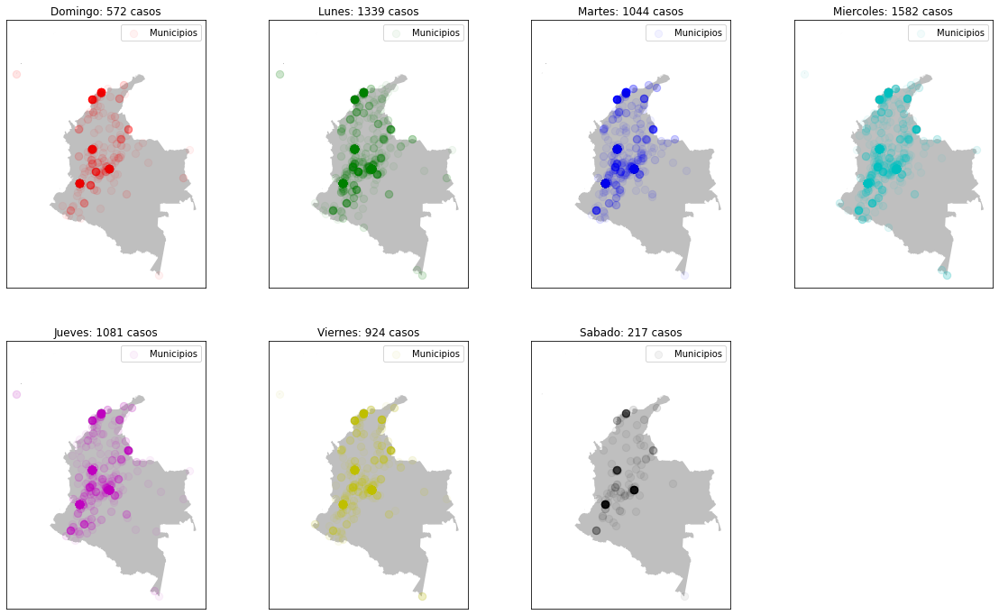

In [0]:
street_map = gpd.read_file('colombia.shp')
semana = ["Domingo","Lunes","Martes","Miercoles","Jueves","Viernes","Sabado","Example"]
col = ["r","g","b","c","m","y","k"]
fig, ax = plt.subplots(2,4,figsize = (20,12))
(ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8) = ax
fig.delaxes(ax[1,3])
ax = np.reshape(ax, 8)[:-1]
for k,a in enumerate(ax):
  street_map.plot(color='grey', ax=a, alpha = .5)
  co[k].geometry.plot(marker='o', c=col[k], ax = a, label = 'Municipios', alpha=.05, markersize = 70)
  a.title.set_text(semana[k]+': '+str(len(pr[k]))+' casos')
  a.tick_params(bottom=False,left=False,labelbottom=False,labelleft=False)
  a.legend()


# Resultados:

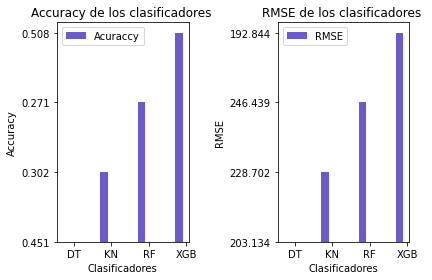

In [0]:
Accuracy=["0.451","0.302", "0.271","0.508"]

RMSE=["203.134", "228.702", "246.439", "192.844"]

clasificadores=["DT", "KN", "RF", "XGB"]
plt.subplot(121)

barWidth=0.2
plt.bar(np.arange(len(Accuracy)), Accuracy, color="#6A5ACD", width=barWidth, label="Acuraccy");
plt.xlabel("Clasificadores");
plt.ylabel("Accuracy");
plt.xticks([r + barWidth for r in range(len(Accuracy))], clasificadores);
plt.title("Accuracy de los clasificadores ");
plt.legend();

plt.subplot(122)
plt.bar(np.arange(len(RMSE)), RMSE, color="#6A5ACD", width=barWidth, label="RMSE");
plt.xlabel("Clasificadores");
plt.ylabel("RMSE");
plt.xticks([r + barWidth for r in range(len(RMSE))], clasificadores);
plt.title("RMSE de los clasificadores ");
plt.legend()

plt.tight_layout()



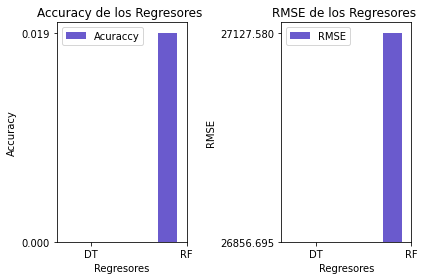

In [0]:
Accuracy=["0.000","0.019"]

RMSE=["26856.695", "27127.580"]

Regresores=["DT", "RF"]
plt.subplot(121)

barWidth=0.2
plt.bar(np.arange(len(Accuracy)), Accuracy, color="#6A5ACD", width=barWidth, label="Acuraccy");
plt.xlabel("Regresores");
plt.ylabel("Accuracy");
plt.xticks([r + barWidth for r in range(len(Accuracy))], Regresores);
plt.title("Accuracy de los Regresores ");
plt.legend();

plt.subplot(122)
plt.bar(np.arange(len(RMSE)), RMSE, color="#6A5ACD", width=barWidth, label="RMSE");
plt.xlabel("Regresores");
plt.ylabel("RMSE");
plt.xticks([r + barWidth for r in range(len(RMSE))], Regresores);
plt.title("RMSE de los Regresores ");
plt.legend()

plt.tight_layout()


# Conclusiones:



*  El clasificador con mejor accuracy, y evidentemente menor RMSE, es MultiOutputClassifier con XGBClassifier como parametro.
*    El Regresor con mejor accuracy, y evidentemente menor RMSE, es Decision Tree Regressor.
*  Se predice que el día miercoles, es el día que se produce más casos de delitos sexuales.
*  Con el regresor se predice que la hora donde ocurre más casos,se encuentra en el intervalo de la mañana y el medio día.


# Bibliografia:



*   https://www.datos.gov.co/Seguridad-y-Defensa/Delitos-sexuales-2019/tdf6-87g7  
*   https://scikit-learn.org/stable/modules/generated/sklearn.multioutput.MultiOutputClassifier.html
*   https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html
*   https://gitlab.com/bivl2ab/academico/cursos-uis/ai/ai-uis-student.git

